In [1]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
from banksy.main import median_dist_to_nearest_neighbour
from banksy.initialize_banksy import initialize_banksy
from banksy.embed_banksy import generate_banksy_matrix
from banksy.main import concatenate_all
from banksy_utils.umap_pca import pca_umap
from banksy.cluster_methods import run_Leiden_partition
from banksy.plot_banksy import plot_results
import matplotlib.pyplot as plt
import warnings

/autodl-fs/data/viszip/banksy/cluster_methods.py:18: UserWarning: 
No rpy2 installed. BANKSY will run, but mclust will not work.
Note: you can still use the default leiden option for clustering.
Install rpy2 and R in your conda environment if you want to use mclust for clustering.

  warnings.warn(warn_str)


In [2]:
warnings.filterwarnings("ignore")
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'white'

adata = sc.read_h5ad('./visium_hd_adata.h5ad')
adata.var_names_make_unique()
adata.obs['sample'] = 'P1_CRC'

In [3]:

# 质控
adata.var['mt'] = adata.var_names.str.upper().str.startswith('MT-')
adata.var['ribo'] = adata.var_names.str.upper().str.startswith(("RPS", "RPL"))
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
adata.obs['log10GenesPerUMI'] = np.log10(adata.obs['n_genes_by_counts']) / np.log10(adata.obs['total_counts'])

In [4]:
# 细胞过滤
sc.pp.filter_cells(adata, min_counts=20)
sc.pp.filter_cells(adata, max_counts=800)
sc.pp.filter_genes(adata, min_cells=5)
adata = adata[
    (adata.obs['log10GenesPerUMI'] > 0.8) & (adata.obs['log10GenesPerUMI'] < 0.99) & (adata.obs['pct_counts_mt'] < 15)]

In [5]:
# Normalize
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata)

In [6]:
# HVG
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(
    adata,
    flavor='seurat',
    n_top_genes=2000
)
adata.raw = adata  # 保存原始数据
adata = adata[:, adata.var.highly_variable]

In [7]:
if 'array_col' in adata.obs.columns and 'array_row' in adata.obs.columns:
    # 创建 spatial 坐标矩阵
    spatial_coords = np.column_stack([
        adata.obs['array_col'].values,
        adata.obs['array_row'].values
    ])
    adata.obsm['spatial'] = spatial_coords
    print("手动创建 adata.obsm['spatial'] 成功")

手动创建 adata.obsm['spatial'] 成功



Median distance to closest cell = 1.0

---- Ran median_dist_to_nearest_neighbour in 4.47 s ----


Median distance to closest cell = 1.0

---- Ran median_dist_to_nearest_neighbour in 4.73 s ----

--- 初始化 BANKSY (adaptive k (k_min=5, k_max=20, density_radius=30.0, method=linear_rank_percentile)) ---
  使用 'scaled_gaussian' 衰减, 估计的全局 sigma: 1.6628
----- 为自适应k模式绘制边直方图 (m = 0) -----

Edge weights (distances between cells): median = 1.4142135623730951, mode = 1.0

---- Ran plot_edge_histogram in 0.66 s ----


Edge weights (weights between cells): median = 0.6965090252479642, mode = 0.831849410313815

---- Ran plot_edge_histogram in 0.56 s ----

----- 绘制权重图 (adaptive k (k_min=5, k_max=20, density_radius=30.0, method=linear_rank_percentile)) -----
Maximum weight: 1.0

---- Ran plot_graph_weights in 95.56 s ----

Maximum weight: 1.0

---- Ran plot_graph_weights in 53.09 s ----

----- 绘制方位角 (adaptive k (k_min=5, k_max=20, density_radius=30.0, method=linear_rank_percentile)) -----
Maximum weight:

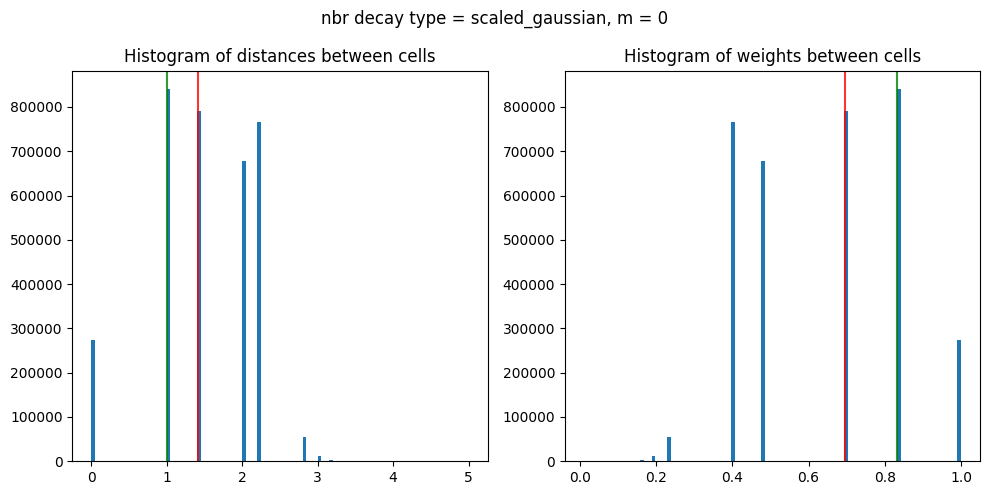

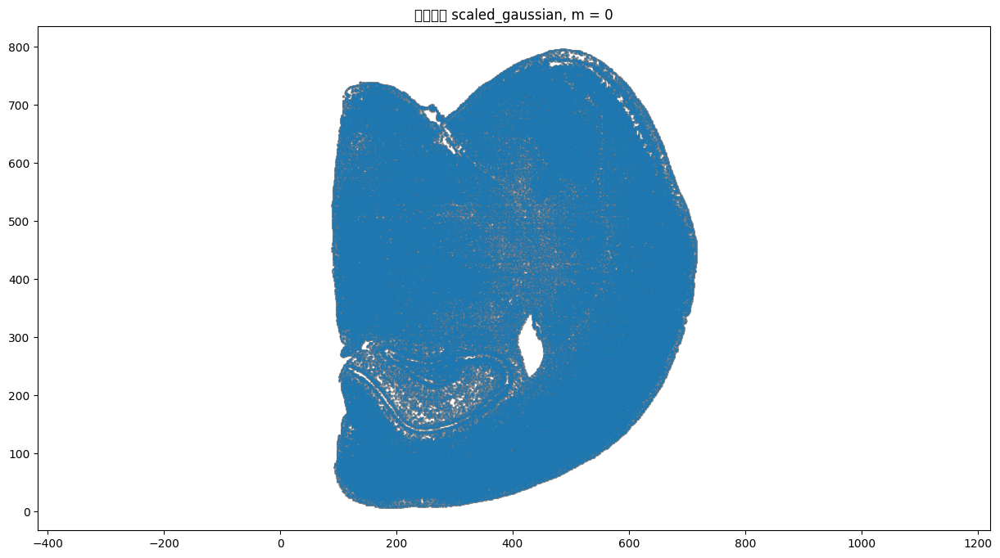

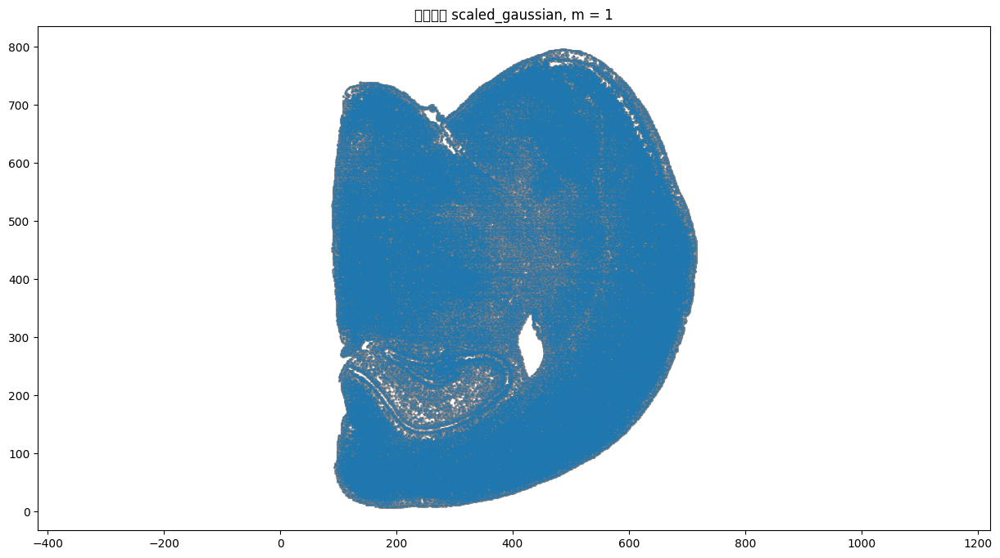

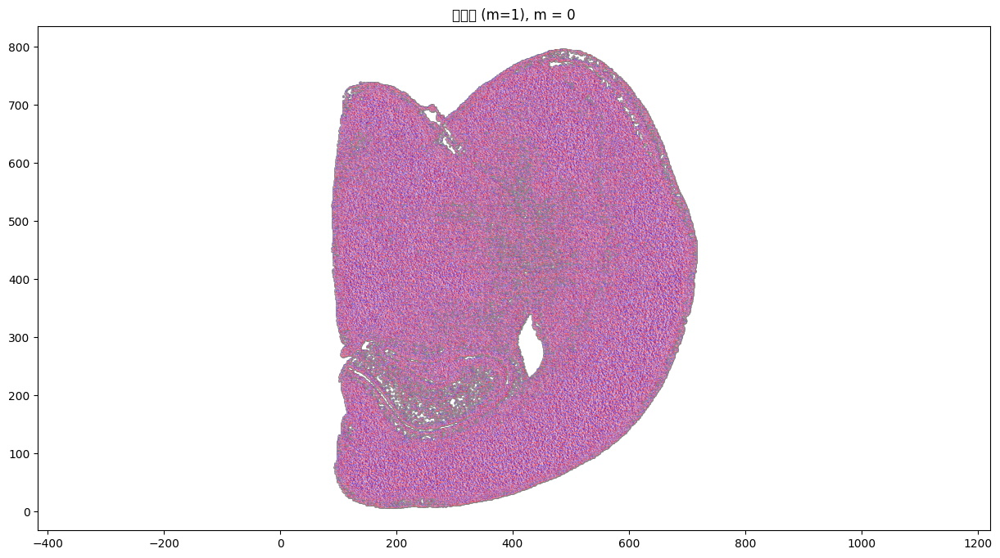

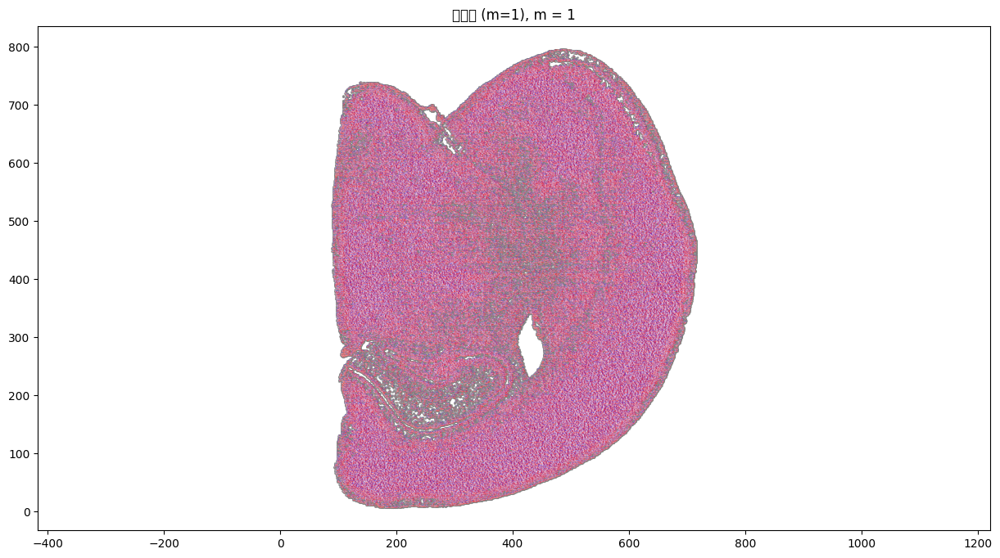

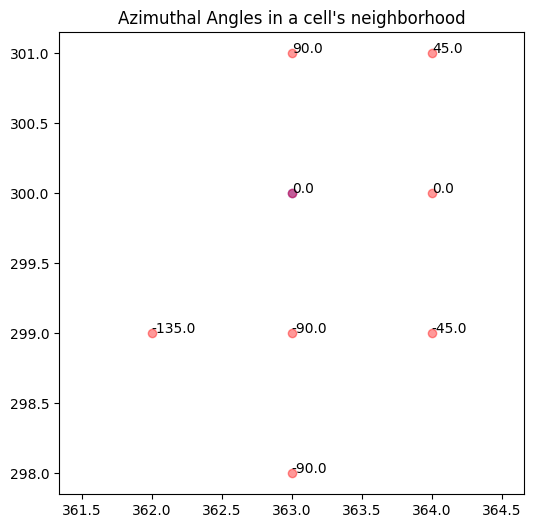

In [8]:
from banksy.initial_banksy_adaptive import initialize_banksy
## 构建空间最近邻图
# Find median distance to closest neighbours
nbrs = median_dist_to_nearest_neighbour(adata, key="spatial")

## 生成距离空间权重(Generate spatial weights from distance)
# 使用自适应邻域
coord_keys = ('array_col', 'array_row', 'spatial')
adaptive_k_settings = {
    'density_radius': 30.0,  # 用于估计局部密度的半径
    'k_min': 15,              # 自适应k的最小值
    'k_max': 50,             # 自适应k的最大值
    'method': 'linear_rank_percentile' # 映射方法
}
banksy_dict = initialize_banksy(
    adata,
    coord_keys,
    adaptive_k_config=adaptive_k_settings, # 启用自适应k
    nbr_weight_decay="scaled_gaussian",
    max_m=1,
    plt_edge_hist=True,
    plt_nbr_weights=True,
    plt_agf_angles=True,
    plt_theta=True
)

In [9]:
# 生成BANKSY矩阵
# BANKSY几个主要超参数
resolutions = [0.5]  # clustering resolution for UMAP
pca_dims = [20]  # Dimensionality in which PCA reduces to
lambda_list = [0.2]  # list of lambda parameters
max_m = 1
banksy_dict, banksy_matrix = generate_banksy_matrix(
    adata,
    banksy_dict,
    lambda_list,
    max_m
)

Runtime Jun-15-2025-20-58

2000 genes to be analysed:
Gene List:
Index(['St18', 'Sgk3', 'Tcf24', 'Prex2', 'Crisp4', 'Defb41', 'Mcm3', 'Paqr8',
       'Gsta3', 'Khdc1a',
       ...
       'Car5b', 'Cltrn', 'Piga', 'Gpm6b', 'Tceanc', 'Tlr8', 'Tlr7', 'Uba1y',
       'mt-Nd3', 'mt-Nd6'],
      dtype='object', length=2000)

Check if X contains only finite (non-NAN) values
Decay Type: scaled_gaussian
Weights Object: {'weights': {0: <273368x273368 sparse matrix of type '<class 'numpy.float64'>'
	with 3416529 stored elements in Compressed Sparse Row format>, 1: <273368x273368 sparse matrix of type '<class 'numpy.float64'>'
	with 3416529 stored elements in Compressed Sparse Row format>}}

Nbr matrix | Mean: 0.03 | Std: 0.2
Size of Nbr | Shape: (273368, 2000)
Top 3 entries of Nbr Mat:

[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]

AGF matrix | Mean: 0.02 | Std: 0.16
Size of AGF mat (m = 1) | Shape: (273368, 2000)
Top entries of AGF:
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
Ran 'Create BANKSY Matrix' in 3.2 

In [10]:
## 将非空间结果附加到banksy_dict以进行比较（不必要）
banksy_dict["nonspatial"] = {
    # Here we simply append the nonspatial matrix (adata.X) to obtain the nonspatial clustering results
    0.0: {"adata": concatenate_all([adata.X], 0, adata=adata), }
}

Scale factors squared: [1.]
Scale factors: [1.]


In [11]:
## PCA降维, UMAP可视化
pca_umap(
    banksy_dict,
    pca_dims=pca_dims,  # 这里PCA降到20个维度
    add_umap=True,
    plt_remaining_var=False,
)

## 细胞聚类--默认情况下，建议使用基于分辨率的聚类（即leiden 或 louvain）
results_df, max_num_labels = run_Leiden_partition(
    banksy_dict,
    resolutions,
    num_nn=50,  # k_expr: number of neighbours in expression (BANKSY embedding or non-spatial) space
    num_iterations=-1,  # run to convergenece
    partition_seed=12345,
    match_labels=True,
)

Current decay types: ['scaled_gaussian', 'nonspatial']

Reducing dims of dataset in (Index = scaled_gaussian, lambda = 0.2)

Setting the total number of PC = 20
Original shape of matrix: (273368, 6000)
Reduced shape of matrix: (273368, 20)
------------------------------------------------------------
min_value = -214.69592438008664, mean = 9.470506833336386e-17, max = 672.6879176667203

Conducting UMAP and adding embeddings to adata.obsm["reduced_pc_20_umap"]
UMAP embedding
------------------------------------------------------------
shape: (273368, 2)


AxisArrays with keys: reduced_pc_20, reduced_pc_20_umap

Reducing dims of dataset in (Index = nonspatial, lambda = 0.0)

Setting the total number of PC = 20
Original shape of matrix: (273368, 2000)
Reduced shape of matrix: (273368, 20)
------------------------------------------------------------
min_value = -224.22158813476562, mean = 3.6177652873448096e-07, max = 604.034423828125

Conducting UMAP and adding embeddings to adata.obsm["re

,decay,lambda_param,num_pcs,resolution,num_labels,labels,adata,relabeled
nonspatial_pc20_nc0.00_r0.50,nonspatial,0.0,20,0.5,17,"Label object:\nNumber of labels: 17, number of...",[[[View of AnnData object with n_obs × n_vars ...,"Label object:\nNumber of labels: 17, number of..."
scaled_gaussian_pc20_nc0.20_r0.50,scaled_gaussian,0.2,20,0.5,16,"Label object:\nNumber of labels: 16, number of...",[[[View of AnnData object with n_obs × n_vars ...,"Label object:\nNumber of labels: 16, number of..."


Saving figure at tmp_png/slideseq_mousecerebellum_nonspatial_pc20_nc0.00_r0.50_spatialmap.png
number of labels: 17
---- Ran plot_2d_embeddings in 0.02 s ----

number of labels: 17
---- Ran plot_2d_embeddings in 0.03 s ----

number of labels: 17
---- Ran plot_2d_embeddings in 0.02 s ----

---- Ran row_normalize in 0.00 s ----


matrix multiplying labels x weights x labels-transpose ((17, 273368) x (273368, 273368) x (273368, 17))

Saving figure at tmp_png/slideseq_mousecerebellum_scaled_gaussian_pc20_nc0.20_r0.50_spatialmap.png
number of labels: 16
---- Ran plot_2d_embeddings in 0.02 s ----

number of labels: 16
---- Ran plot_2d_embeddings in 0.04 s ----

number of labels: 16
---- Ran plot_2d_embeddings in 0.02 s ----

---- Ran row_normalize in 0.00 s ----


matrix multiplying labels x weights x labels-transpose ((16, 273368) x (273368, 273368) x (273368, 16))


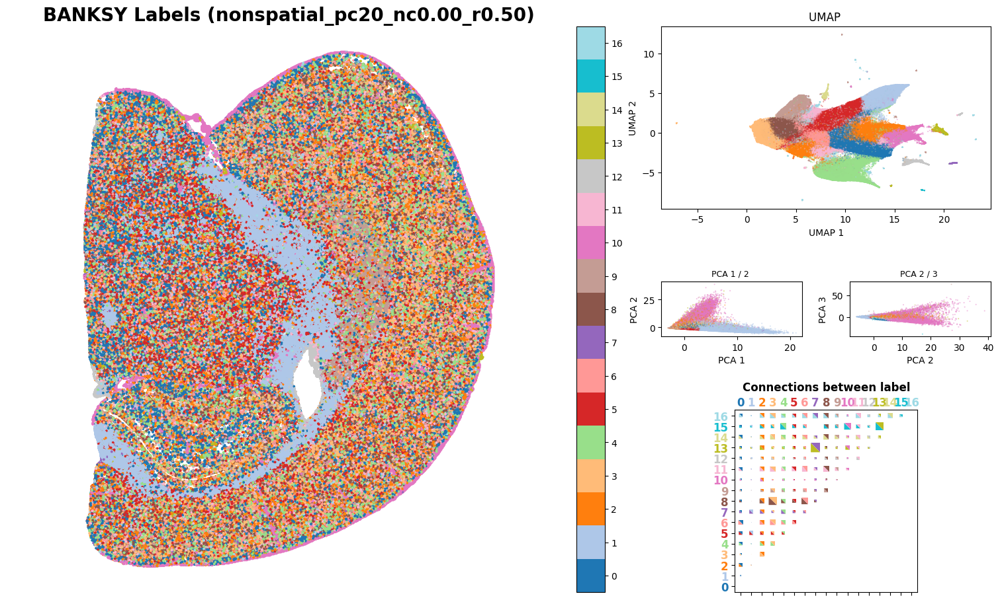

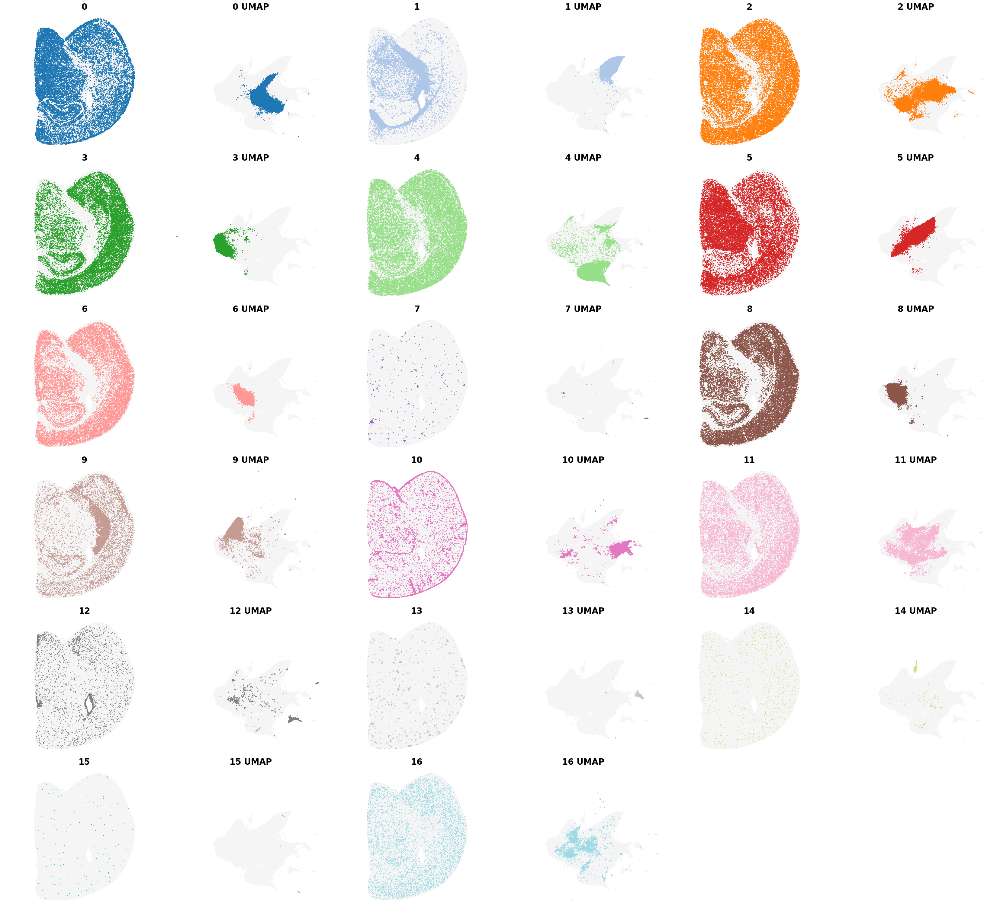

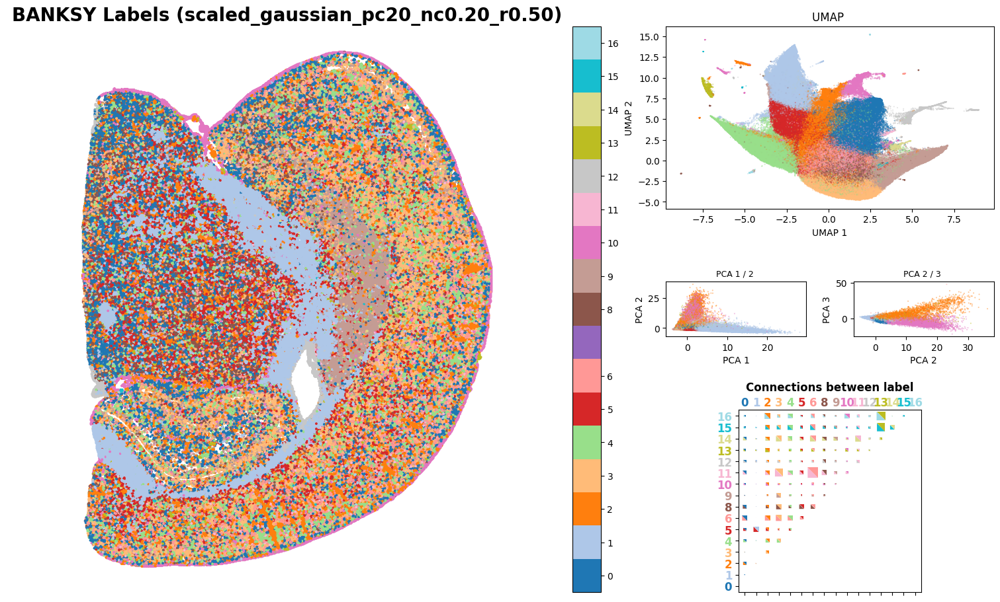

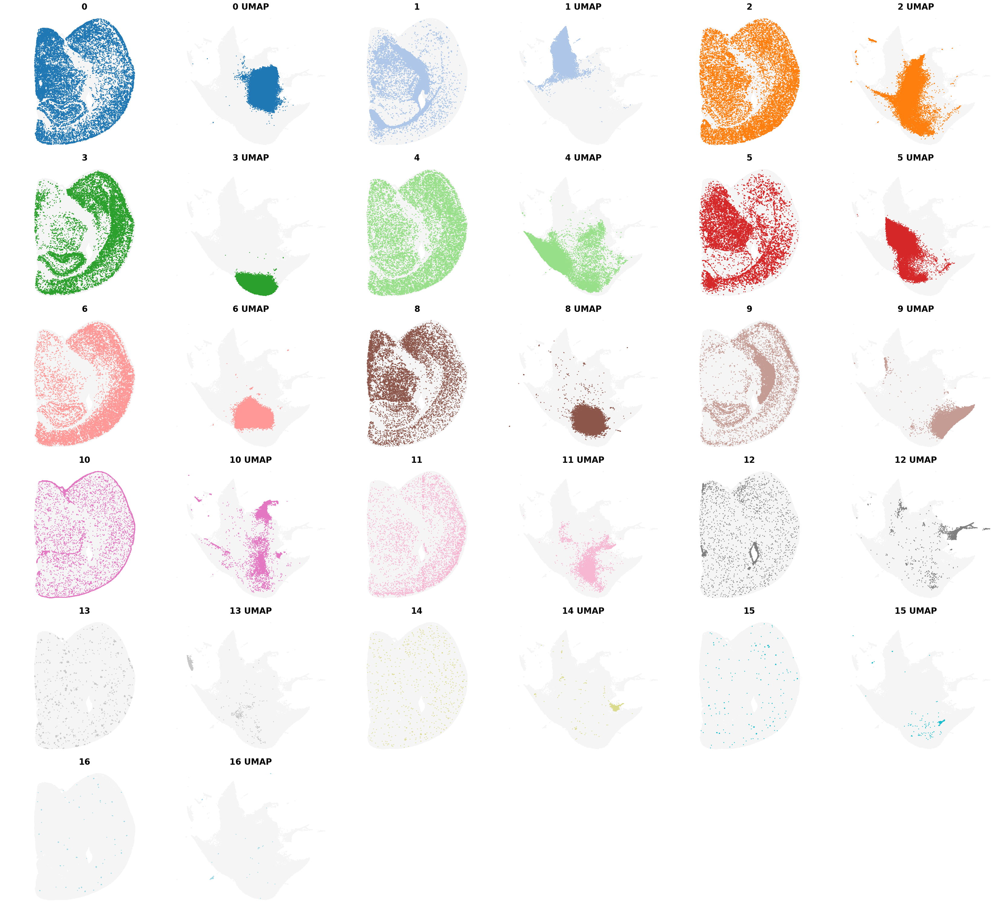

In [12]:
from banksy.plot_banksy import plot_results
c_map =  'tab20' # specify color map
weights_graph =  banksy_dict['scaled_gaussian']['weights'][0]
plot_results(
    results_df,
    weights_graph,
    c_map,
    match_labels = True,
    coord_keys = coord_keys,
    max_num_labels  =  max_num_labels,
    save_path = 'tmp_png',
    save_fig = True
)

In [15]:
from banksy_utils.cluster_utils import pad_clusters, create_spatial_nonspatial_adata,  refine_cell_types
# 手动为选定的聚类分配生物学身份标注
cluster2annotation_spatial = {
    "0": "0",        # 外层皮质层 - 浅蓝色，边缘连续分布
    "1": "1",        # 内层皮质层 - 深蓝色，内侧主要区域  
    "2": "2",           # 中间过渡区 - 紫色，连接不同区域
    "9": "9" ,           # 特化生态位 - 棕色，特定功能区域
    "10": "10"        # 边界界面 - 暗红色，组织边界区域
}
pad_clusters(cluster2annotation_spatial, list(range(max_num_labels)))

In [18]:
cluster2annotation_nonspatial = {
    "0": "0",        # 外层皮质层 - 浅蓝色，边缘连续分布
    "1": "1",        # 内层皮质层 - 深蓝色，内侧主要区域  
    "2": "2",           # 中间过渡区 - 紫色，连接不同区域
    "9": "9" ,           # 特化生态位 - 棕色，特定功能区域
    "10": "10"        # 边界界面 - 暗红色，组织边界区域    
}

print(cluster2annotation_spatial,"\n", cluster2annotation_nonspatial)

# save annotations in two different anndata objects (adata_spatial and adata_nonspatial)

adata_spatial, adata_nonspatial = create_spatial_nonspatial_adata(results_df,
                                    pca_dims,
                                    lambda_list, 
                                    resolutions,
                                    cluster2annotation_spatial,
                                    cluster2annotation_nonspatial)

{'0': '0', '1': '1', '2': '2', '9': '9', '10': '10'} 
 {'0': '0', '1': '1', '2': '2', '9': '9', '10': '10'}
scaled_gaussian_pc20_nc0.20_r0.50
nonspatial_pc20_nc0.00_r0.50


In [19]:
from banksy_utils.plot_utils import plot_DE_genes, plot_DE_genes_refined, plot_connection_grid, plot_clusters

cluster2annotation_refine = {
   # "Boundary_Interface_Cells" : "other",
}

adata_spatial_filtered, adata_nonspatial_filtered = refine_cell_types(adata_spatial, 
                                                                      adata_nonspatial,
                                                                      cluster2annotation_refine
                                                                      )

In [20]:
adata_self = plot_DE_genes_refined(adata_spatial_filtered, plot_heatmap = False, save_fig = False)

         Falling back to preprocessing with `sc.pp.pca` and default params.


All refined cell types: Index(['0', '1', '10', '2', '9'], dtype='object')
[1. 1. 1. ... 1. 1. 1.] (273368, 273368)
[1. 1. 1. ... 1. 1. 1.] (273368, 273368)


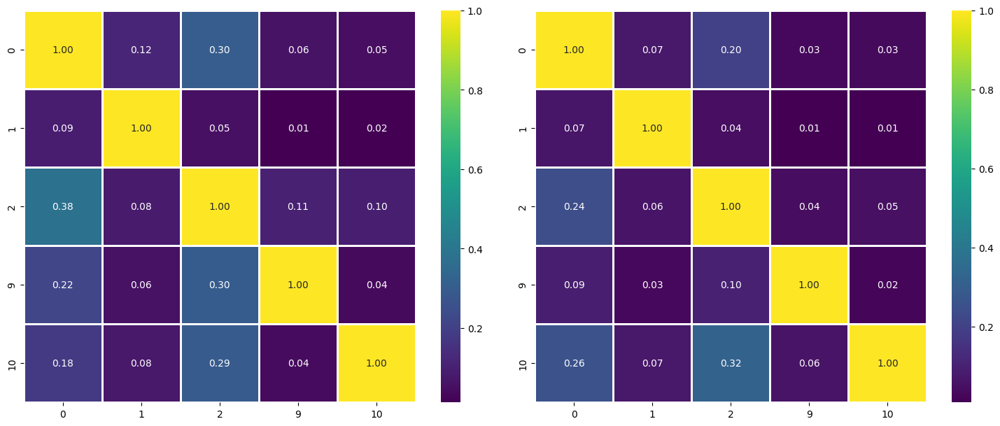

In [21]:
cell_types = ["0",
             "1",
             "2",
             "9",
             "10"]

plot_connection_grid(
    banksy_dict["scaled_gaussian"]["weights"][0].copy(),
    adata_nonspatial,
    adata_spatial,
    cell_types= cell_types,
    save_fig=False
)

NameError: name 'spatial' is not defined

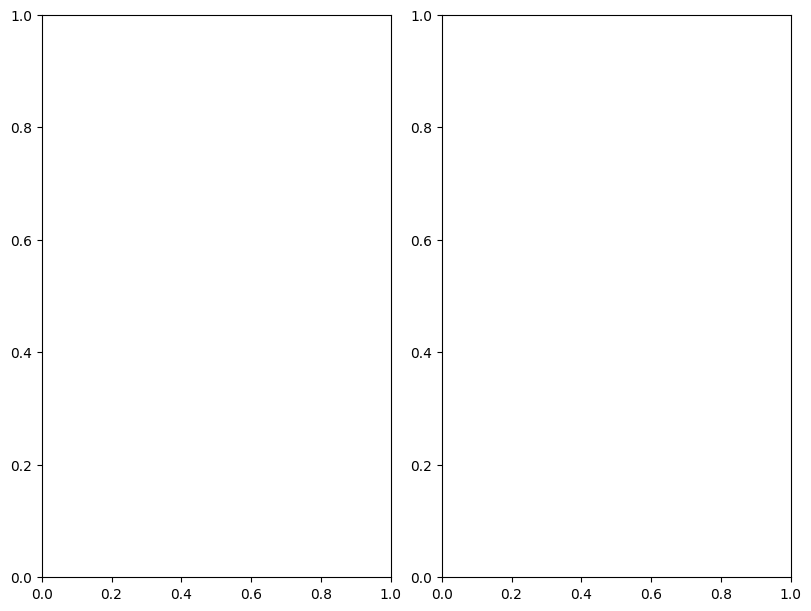

In [26]:
adata_spatial.obsm['coord_xy'] = adata_spatial.obsm['spatial']
adata_nonspatial.obsm['coord_xy'] = adata_nonspatial.obsm['spatial']
# choose colours for each cluster
colors_dict = {
    "0":"tab:blue",
    "1":"tab:orange",
    "2":"tab:red",
    "9":"tab:green",
    "10":"tab:purple"
}

plot_clusters(
    adata_spatial,
    adata_nonspatial,
    colors_dict,
)